# CS6640 Project 2- Ryan Dalby
General notes:
- All images used are either provided by this class, are taken by me personally, or are public domain licensed images from Google Images, Flickr, or from a dataset that is available for non-commerical use like ImageNet.

- Note cells that have the following are to be run to test without training:
```python
# ***
# RUN THIS CELL TO LOAD SAVED MODEL FROM TRAINING ABOVE
# ***
```

- For this part of Project 2 I set out to explore how neural networks perform for denoising images. 
Neural networks can generally perform well denoising test images similar to the training images so I wanted to see how they would perform if trained on a single type of image (in this case grayscale pokemon images) and tested on completely different images I selected. 
My biggest concern/challenge would be related to preventing the neural network from overfitting to the training set so it could generalize to denoising new images. 
(If I were to do this again I would use a validation set to get a better idea of if the network is overfitting.) 



In [ ]:
# To use with colab
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('/content/drive/MyDrive/CS 6640/Project 2/src')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Denoising using Neural Networks

Given a noisy image, we want to find a denoised version of the image. In this part of the project, You will do the following:-

-  From true images, create a noisy training dataset
-  Visualize Different types of noisy images and comment on the differences
-  Using different models find denoised images.
-  Visualize noisy and their denoised counter parts for atleast 2-5 input samples for analysis.
-  Analyze which models give good results and why ?

*** Extra Python libraries(Pytorch, pandas, csv) are needed for this assignment. So please ensure the cell directly below excutes properly before proceeding with the assignment. If it doesn't please make sure to install those libraries before hand. ***

*** If you don't have access to GPU on your computer then install a CPU version of the pytorch library.  Required comments are provided to run the code on a CPU machine. Training on CPU is consideraly slower, so we would advise  you to use CADE machine for this assignment. CADE machine as 4GB GPU's which are enough for this project. ***

In [ ]:
import pandas as pd
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import random
import skimage as ski
from skimage import io, transform, metrics, filters, restoration
import csv
import os
import random
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.optim as optim
import sys
sys.path.insert(1, '../utils')
from utils import NoiseDatsetLoader

# Adding Noise in the Images And Creating a Noisy Dataset

In [ ]:
def noiseAddtion(image,noiseIndicator):
    # This function gets an image of size m x n. Range of values is (0,1).
    # noiseIndicator is type of noise that needs to be added to the image
    # noiseIndicator == 0 indicates an addition of gaussian noise with mean 0 and var 0.08
    # noiseIndicator == 1 indicates an addition of Salt and Pepper noise with intensity variation of 0.08
    # noiseIndicator == 2 indicates an addition of poisson noise
    # noiseIndicator == 3 indicates an addition of Speckle noise of mean 0 and var 0.05
    
    ## This function should return a noisy version of the input image
    
    ##  ***************** Your Code starts here ***************** ##
    if noiseIndicator == 0:
        noisy = ski.util.random_noise(image, mode='gaussian', mean=0, var=0.08)
    elif noiseIndicator == 1:
        noisy = ski.util.random_noise(image, mode='s&p', amount=0.08)
    elif noiseIndicator == 2:
        noisy = ski.util.random_noise(image, mode='poisson')
    elif noiseIndicator == 3:
        noisy = ski.util.random_noise(image, mode='speckle', mean=0, var=0.05)
    else:
        raise Exception('Noise indicator value was not valid')

    ## ***************** Your Code ends here ***************** ##
    return noisy

In [ ]:
def writeCSV(csv_file_name, Trainingdictlist):
    csv_columns = ['RefImageName','NoiseType','NoisyImage']
    try:
        with open(csv_file_name, 'w') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=csv_columns)
            writer.writeheader()
            for data in Trainingdictlist:
                writer.writerow(data)
    except IOError:
        print("I/O error")

def createNoisyDataset(root_dir,train,numberOfSamples,noisyIndicatorLow,noisyIndicatorHigh):
    if(train==1):
        name_csv = pd.read_csv('../utils/file_name_train.csv')
        csv_file_name = "TrainingDataSet.csv"
        directoryName = "TrainingDataset/"
        Trainingdictlist = [dict() for x in range(numberOfSamples)]
        if not os.path.exists(directoryName):
            os.makedirs(directoryName)
    else:
        name_csv = pd.read_csv('../utils/file_name_test.csv')
        csv_file_name = "TestingDataSet.csv"
        directoryName = "TestingDataset/"
        Trainingdictlist = [dict() for x in range(numberOfSamples)]
        if not os.path.exists(directoryName):
            os.makedirs(directoryName)

    for i in range(numberOfSamples):
        r2 = random.randint(0,len(name_csv)-1) # Choose an image randomly from the dataset
        # Read the image from a path
        img_name = os.path.join(root_dir,name_csv.iloc[r2, 0])
        image    = io.imread(img_name)

        # Normalize the image to range (0,1) 
        M,N      = image.shape
        maximumPixelValue = np.max(image)
        image = image/maximumPixelValue

        # Choosing the noise randomly 
        r1 = random.randint(noisyIndicatorLow,noisyIndicatorHigh)
        noisyImage = noiseAddtion(image,r1)
        Trainingdictlist[i]={'RefImageName':img_name,'NoiseType': r1,'NoisyImage':str(i)+'.png'}
        io.imsave(directoryName+str(i)+'.png',noisyImage)
    writeCSV(csv_file_name, Trainingdictlist)

## The function below calls the above function to create a noisy training and testing dataset. 

Don't worry about lossy conversion warnings.

In [ ]:
createNoisyDataset('../utils/GrayScale',1,400,0,3) ## Creating 400 samples of Training Data
createNoisyDataset('../utils/GrayScale',0,200,0,3) ## Creating 200 samples of Training Data

## Visualize Samples of Each of the noise Type here Using any plotting library

Hint:- You can use Subplots to display different noisy images

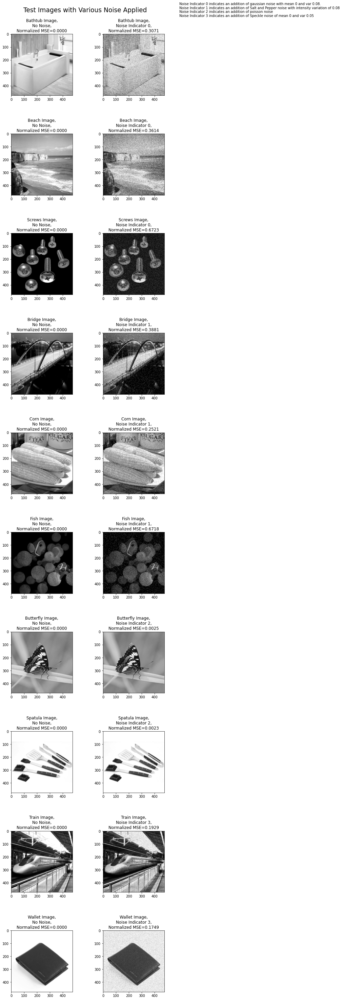

In [ ]:
## Your Code Starts here

img_root_dir = '../utils/images/'
bathtub_img = ski.color.rgb2gray(io.imread(img_root_dir+'bathtub.png'))
beach_img = ski.color.rgb2gray(io.imread(img_root_dir+'beach.png'))
screws_img = ski.color.rgb2gray(io.imread(img_root_dir+'screws.png'))
bridge_img = ski.color.rgb2gray(io.imread(img_root_dir+'bridge.png'))
corn_img = ski.color.rgb2gray(io.imread(img_root_dir+'corn.png'))
fish_img = ski.color.rgb2gray(io.imread(img_root_dir+'fish.png'))
butterfly_img = ski.color.rgb2gray(io.imread(img_root_dir+'butterfly.png'))
spatula_img = ski.color.rgb2gray(io.imread(img_root_dir+'spatula.png'))
train_img = ski.color.rgb2gray(io.imread(img_root_dir+'train.png'))
wallet_img = ski.color.rgb2gray(io.imread(img_root_dir+'wallet.png'))

img_list_org = [ 
bathtub_img,
beach_img,
screws_img,
bridge_img,
corn_img,
fish_img,
butterfly_img,
spatula_img,
train_img,
wallet_img
]

test_img_width = 475
test_img_height = 475

img_list = []
for img in img_list_org:
  img_list.append(ski.transform.resize(img, (test_img_height, test_img_width)))

idx_to_img_dict = {
    0:'Bathtub Image', 
    1:'Beach Image', 
    2:'Screws Image', 
    3:'Bridge Image',
    4:'Corn Image',
    5:'Fish Image', 
    6:'Butterfly Image',
    7:'Spatula Image',
    8:'Train Image',
    9:'Wallet Image',
    }

noise_img_dict_list = []
for i in range(len(img_list)):
    img = img_list[i]
    noise_type = int(i//2.6)
    img_dict = {
    'No Noise':img,
    'Noise Indicator {0}'.format(noise_type):noiseAddtion(img, noise_type)
    }
    noise_img_dict_list.append(img_dict)

def plot_images(img_dict_list, idx_to_img_dict, title, info_text, fig_width=1, fig_height=1):
    fig, ax = plt.subplots(len(img_dict_list), len(img_dict_list[0]),figsize=(fig_width,fig_height))
    fig.tight_layout()
    fig.subplots_adjust(hspace=0.5, wspace=0.5)
    for i, img_dict in enumerate(img_dict_list):
        key_list = list(img_dict.keys())
        for j,noise_key in enumerate(key_list):
            img = img_dict[noise_key]
            ax[i][j].imshow(img, cmap='gray')
            normalized_mse = metrics.normalized_root_mse(img, img_dict['No Noise'])
            ax[i][j].set_title('{0},\n{1},\nNormalized MSE={2:.4f}'.format(idx_to_img_dict[i], noise_key, normalized_mse))
    fig.suptitle(title, fontsize=(fig_width*fig_height)/15, y=1.02)
    fig.text(1.05, 1.01, info_text)
    plt.show()

info_text = 'Noise Indicator 0 indicates an addition of gaussian noise with mean 0 and var 0.08.\nNoise Indicator 1 indicates an addition of Salt and Pepper noise with intensity variation of 0.08\nNoise Indicator 2 indicates an addition of poisson noise\nNoise Indicator 3 indicates an addition of Speckle noise of mean 0 and var 0.05'
plot_images(noise_img_dict_list, idx_to_img_dict, 'Test Images with Various Noise Applied', info_text, fig_width=7, fig_height=40)
## Your Code ends here

## Comment on the Differences of different sample of noisy images
I chose 10 images that display different image features. 
1. A bathtub image that had additive gaussian noise applied to it. 
This is a clear and bright image of a bathroom where the subject is the bathtub and will provid a good baseline for denoising gaussian noise.
2. A beach image that has additive gaussian noise applied to it.
This is a landscape image with no distinct subject making it different than the bathtub image.
3. An image of screws that has the background removed and cropped screws in it that has additive gaussian noise applied to it.
This image is a "cartoonish" and thus it can show how denoising works in the case of no realistic background. 
4. A bridge image that has "salt and pepper" noise applied to it.
This is a dark landscape photo that will provide a good idea of how "salt and pepper" denoising work in dark landscape photos.
5. A corn image that has "salt and pepper" noise applied to it. 
This image is a clear and bright image of corn will provide a good baseline (similar to the bathtub image) of how denoising "salt and pepper" noise works.
6. A fish image that has "salt and pepper" noise applied to it.
This is a very dark image that provides a good test of really dark image denoising.
7. A butterfly image that has poisson noise applied to it.
This is a clear photo of a butterfly that provides a good test of poisson denoising.
8. A spatula image that has poisson noise applied to it.
This is an image with little to no background that provides another test of denoising an image having a clear subject with no background.
9. A train image that has speckle noise applied to it.
This image is a landscape with a subject and provides a diverse background of features to test speckle denoising.
10. A wallet image that has speckle noise applied to it.
This is a good image to get a basline of denoising speckle noise since it is clear and has little background.


# Neural Network for Denoising

We now have a noisy training set and a reference images.

In [ ]:
dtype = torch.float32 ## instialize the data types used in training
cpu = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Complete the Training Function Below

In [ ]:
def trainingLoop(dataloader,model,optimizer,nepochs):
    ## This function Trains your model for 'nepochs'
    ## Using optimizer and model your passed as arguments
    ## On the data present in the DataLoader class passed
    ##
    ## This function the final loss value

    model = model.to(device=cpu)
    
    ## Our Loss function for this exercise is fixed to MSELoss
    loss_function = nn.MSELoss()
    loss_array =[]
    for e in range(nepochs):
            print("Epoch", e)
            for t, temp in enumerate(dataloader):
                ## Before Training Starts, put model in Training Mode
                model.train()
                NoisyImage = temp['NoisyImage'].to(device=cpu,dtype=dtype)
                referenceImage = temp['image'].to(device=cpu,dtype=dtype)
                ## Pass your input images through the model
                ## Be sure to set the gradient as Zero in Optmizer before backward pass. Hint:- zero_grad()
                ## Step the otimizer on after backward pass
                ## Assign the value computed by the loss function to a varible named 'loss'

                ## Due to dataset being Gray you may have to use unsqueeze function here

                ## ************* Start of your Code *********************** ##

                # print(NoisyImage.requires_grad)
                # print(referenceImage.requires_grad)
                denoised_image = model(NoisyImage)
                # print(denoised_image.requires_grad)
                # loss_function.requires_grad_()
                loss = loss_function(denoised_image, referenceImage)
                # print(loss.requires_grad)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # Ideally I would have a validation set to test against to get model state before it overfits to data
                
                # print()
                ## ************ End of your code ********************   ##
            loss_array.append(loss.cpu().detach().numpy()) # Indented this so loss is recordered per-epoch
            print("Training loss: ",loss)
    return loss, loss_array

In [ ]:
TrainingSet = NoiseDatsetLoader(csv_file='TrainingDataSet.csv', root_dir_noisy='TrainingDataset')
TestingSet  = NoiseDatsetLoader(csv_file='TestingDataSet.csv' , root_dir_noisy='TestingDataset')

## Batch Size is a hyper parameter, You may need to play with this paramter to get a more better network
## This is a user controlled parameter you can change this value
batch_size=16
# batch_size=32

## DataLoader is a pytorch Class for iterating over a dataset
# dataloader_train  = DataLoader(TrainingSet,batch_size=batch_size,num_workers=4)
dataloader_train  = DataLoader(TrainingSet,batch_size=batch_size)
dataloader_test   = DataLoader(TestingSet,batch_size=1)

## Model 1 

- Declare a model with one conv2d filter with 1 input channel and output channel

In [ ]:
## ************* Start of your Code *********************** ##

input_channels = 1
channel_1 = 1 
model = nn.Sequential(
    nn.Conv2d(input_channels, channel_1, kernel_size=5, padding=2)
    # nn.Conv2d(input_channels, channel_1, kernel_size=3, padding=1)
)

## ************ End of your code ********************   ##


In [ ]:
## Set your hypter parameters
learningRate = 1e-2  # Set this value between 1e-2 to 1e-4
weightDecay  = 1e-3  # Set this value between 1e-2 to 1e-4

epochs = 25  # Start with 50 or 100 and can experiment with value as high as 300-400.
# With high epochs (like 100) started overfitting data, thus when generalizing to very different images MSE was poor

## Optimizer
## Please Declare An Optimizer for your model. We suggest you use SGD
## ************* Start of your Code *********************** ##

# NOTE: this cell and the cell above should probably be in the same cell to prevent issues of retraining on already trained on parameters...

optimizer = optim.Adam(model.parameters(), weight_decay=weightDecay, lr=learningRate)

## ************ End of your code ********************   ##

In [ ]:
model_valMSE, model_loss_array = trainingLoop(dataloader_train,model,optimizer,epochs)

Epoch 0
Training loss:  tensor(1284.3459, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 1
Training loss:  tensor(1241.1273, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 2
Training loss:  tensor(1034.1405, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 3
Training loss:  tensor(910.3853, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 4
Training loss:  tensor(807.8389, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 5
Training loss:  tensor(722.5325, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 6
Training loss:  tensor(653.2772, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 7
Training loss:  tensor(597.5104, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 8
Training loss:  tensor(552.9984, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 9
Training loss:  tensor(518.2145, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 10
Training loss:  tensor(491.5371, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 11
Training loss:  tensor(470.7475, device='cuda:0', gr

### Plot the graph of loss vs epoch

In [ ]:
def plot_loss_epoch(loss_array):
  plt.figure()
  plt.plot(loss_array, label='Train')
  plt.xlabel('Epoch')
  plt.ylabel('Loss(MSE)')
  plt.legend()
  plt.show()

In [ ]:
def save_model(model, filename):
  torch.save(model.state_dict(), '../models/{0}'.format(filename))

In [ ]:
def load_model(model_to_load_onto, filename):
  model_to_load_onto.load_state_dict(torch.load('../models/{0}'.format(filename)))

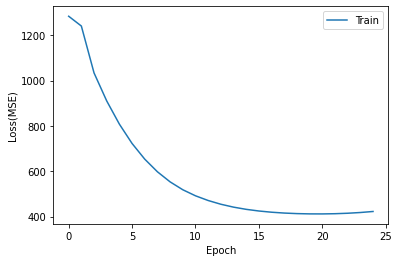

In [ ]:
## ************* Start of your Code *********************** ##

plot_loss_epoch(model_loss_array)
save_model(model, 'model.pt')

# ************ End of your code ********************   ##

## Complete the Accuracy Function Below 

In [ ]:
def checkTestingAccuracy(dataloader,model):
    ## This Function Checks Accuracy on Testing Dataset for the model passed
    ## This function should return the loss the Testing Dataset

    ## Before running on Testing Dataset the model should be in Evaluation Mode  
    
    model.eval()
    totalLoss = []
    loss_mse = nn.MSELoss()
    for t, temp in enumerate(dataloader):
        NoisyImage = temp['NoisyImage'].to(device=cpu,dtype=dtype)
        referenceImage = temp['image'].to(device=cpu,dtype=dtype)

        ## For Each Test Image Calculate the MSE loss with respect to Reference Image 
        ## Return the mean the total loss on the whole Testing Dataset
        ## ************* Start of your Code *********************** ##

        denoised_image = model(NoisyImage)
        loss = loss_mse(denoised_image, referenceImage)
        totalLoss.append(loss.item()) # loss is a size 1 tensor so .item() just returns the value of the tensor
        
        # Analyzing images that are nan
        # if np.isnan(loss.item()):
        #     print(loss)
        #     nimg = NoisyImage.cpu().detach().numpy().squeeze()
        #     img = referenceImage.cpu().detach().numpy().squeeze()
        #     dimg = denoised_image.cpu().detach().numpy().squeeze()
        #     plt.figure()
        #     plt.imshow(nimg, cmap='gray')
        #     plt.show()
        #     plt.figure()
        #     plt.imshow(img, cmap='gray')
        #     plt.show()
        #     plt.figure()
        #     plt.imshow(dimg, cmap='gray')
        #     plt.show()
        #     print((img - dimg)**2)
        
        ## ************ End of your code ********************   ##
    return np.mean(totalLoss)

In [ ]:
## Test Your Model. Complete the implementation of checkTestingAccuracy function above 
model.eval()
testMSE = checkTestingAccuracy(dataloader_test,model)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  453.61179145812986


In [ ]:
# ***
# RUN THIS CELL TO LOAD SAVED MODEL FROM TRAINING ABOVE
# ***
model.cuda()
load_model(model, 'model.pt')
model.eval()
testMSE = checkTestingAccuracy(dataloader_test,model)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  453.61179145812986


## Plot some of the Testing Dataset images by passing them through the trained model

In [ ]:
def get_nn_denoise_img_dict_list(model, noise_img_dict_list, model_name_str):
  model.eval()
  denoise_img_dict_list = noise_img_dict_list.copy() 
  for img_dict_list in denoise_img_dict_list:
    # Assumes second value in each img_dict_list is the noisy image
    noisy_img_np = list(img_dict_list.values())[1]
    noisy_img = torch.from_numpy(noisy_img_np).to(device=cpu, dtype=dtype).unsqueeze(0).unsqueeze(0)
    img_dict_list[model_name_str] = model(noisy_img).cpu().detach().numpy().squeeze().squeeze()
  return denoise_img_dict_list

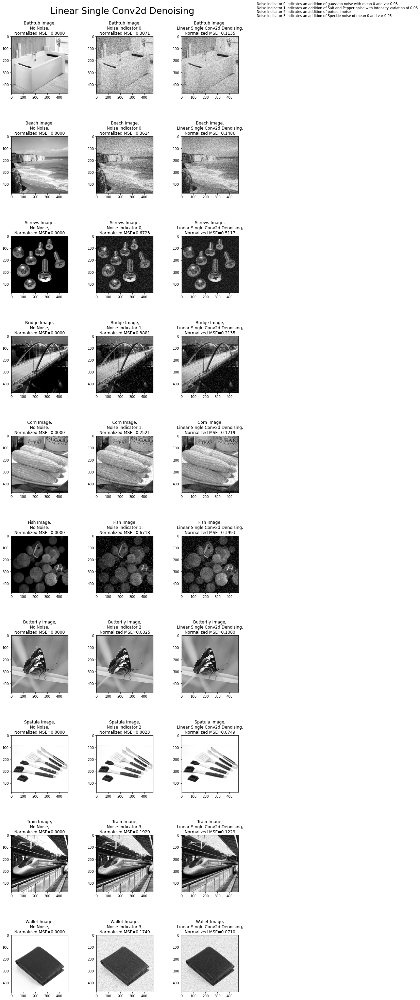

In [ ]:
## ************* Start of your Code *********************** ##

model_img_dict_list = get_nn_denoise_img_dict_list(model, noise_img_dict_list, 'Linear Single Conv2d Denoising')
info_text = 'Noise Indicator 0 indicates an addition of gaussian noise with mean 0 and var 0.08.\nNoise Indicator 1 indicates an addition of Salt and Pepper noise with intensity variation of 0.08\nNoise Indicator 2 indicates an addition of poisson noise\nNoise Indicator 3 indicates an addition of Speckle noise of mean 0 and var 0.05'
plot_images(model_img_dict_list, idx_to_img_dict, 'Linear Single Conv2d Denoising', info_text, fig_width=10, fig_height=40)

## ************ End of your code ********************   ##

## Comment on the Denoised image Obtained
## Single Layer Linear
Looking at the test images I provided to the linear single layer single Conv2d denoising network it seems like this network performed much like a simple box filter with some caveats. 
The main caveat was that the filter was a bit stochastic with each training run and that the filter could actually make some of the images worse in terms of MSE.
For example, some of the times I trained the network the MSE of the denoised images was lower for almost all images when compared to the noisy image. 
Other times it was the other way around for reasons I suspect related to overfitting to the training data that was very different than these images.

Some observations:
- For the gaussian noise the noise was strong enough that the neural network filter could provide great reduction in the noise in terms of visual appearance and MSE.
- For the salt and pepper noise the noise was also fairly strong so the filter provided good reduction in the noise in terms of both visual appearance and MSE.
- For the poisson noise the images were usually worse in terms of visual appearance and MSE, this is likely because there was little noise applied so it was harder for the network to learn this kind of noise.
- For speckle noise the images were better in terms of visual appearance (slightly) and MSE.

In the end the single layer network is a lot like a linear box filter but the network has to learn the kernel weights which means it can perform poorly if it doesn't learn the noise well enough from the data (i.e. the poisson noise in this experiment).



# Model 2

- Declare a model with five conv2d filters, with input channel size of first filter as 1 and output channel size of last filter as 1. 
- All other intermediate channels you can change as you see fit( use a maximum of 8 or 16 channel inbetween layers, otherwise the model might take a huge amount of time to train). 
- Add batchnorm2d layers between each convolution layer for faster convergence.

In [ ]:
## ************* Start of your Code *********************** ##

input_channels = 1
channel_1 = 16 
channel_2 = 8 
channel_3 = 8
channel_4 = 8 
channel_5 = 1 

model2 = nn.Sequential(
    nn.Conv2d(input_channels, channel_1, kernel_size=5, padding=2),
    # nn.BatchNorm2d(channel_1), # Batch norm seems to result in issues of the model just predicting single intensity images
    nn.Conv2d(channel_1, channel_2, kernel_size=3, padding=1),
    # nn.BatchNorm2d(channel_2),
    nn.Conv2d(channel_2, channel_3, kernel_size=3, padding=1),
    # nn.BatchNorm2d(channel_3),
    nn.Conv2d(channel_3, channel_4, kernel_size=3, padding=1),
    # nn.BatchNorm2d(channel_4),
    nn.Conv2d(channel_4, channel_5, kernel_size=5, padding=2),
)

## ************ End of your code ********************   ##

In [ ]:
## Set your hypter parameters
learningRate = 1e-2  # Set this value between 1e-2 to 1e-4
weightDecay  = 1e-3  # Set this value between 1e-2 to 1e-4

epochs = 25 # Start with 50 or 100 Can experiment with maximum 200 or 400 iterations

## Optimizer
## Please Declare An Optimizer for your model. We suggest you use SGD
## ************* Start of your Code *********************** ##

optimizer = optim.Adam(model2.parameters(), weight_decay=weightDecay, lr=learningRate)

## ************ End of your code ********************   ##

In [ ]:
model2_valMSE, model2_loss_array = trainingLoop(dataloader_train,model2,optimizer,epochs)

Epoch 0
Training loss:  tensor(2530.6104, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 1
Training loss:  tensor(1105.9851, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 2
Training loss:  tensor(954.0060, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 3
Training loss:  tensor(825.4175, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 4
Training loss:  tensor(726.8213, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 5
Training loss:  tensor(769.3360, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 6
Training loss:  tensor(674.1878, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 7
Training loss:  tensor(620.7957, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 8
Training loss:  tensor(600.1923, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 9
Training loss:  tensor(582.3257, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 10
Training loss:  tensor(591.8120, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 11
Training loss:  tensor(619.8585, device='cuda:0', gra

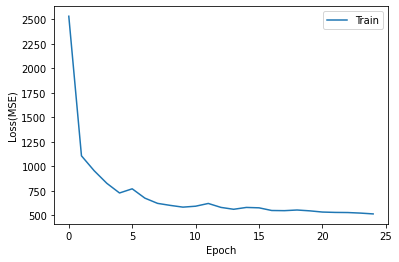

In [ ]:
plot_loss_epoch(model2_loss_array)
save_model(model2, 'model2.pt')

In [ ]:
## Test Your Model
model2.eval()
testMSE = checkTestingAccuracy(dataloader_test,model2)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  504.45413482666015


In [ ]:
# ***
# RUN THIS CELL TO LOAD SAVED MODEL FROM TRAINING ABOVE
# ***
model2.cuda()
load_model(model2, 'model2.pt')
model2.eval()
testMSE = checkTestingAccuracy(dataloader_test,model2)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  504.45413482666015


## Plot some of the Testing Dataset images by passing them through the trained model

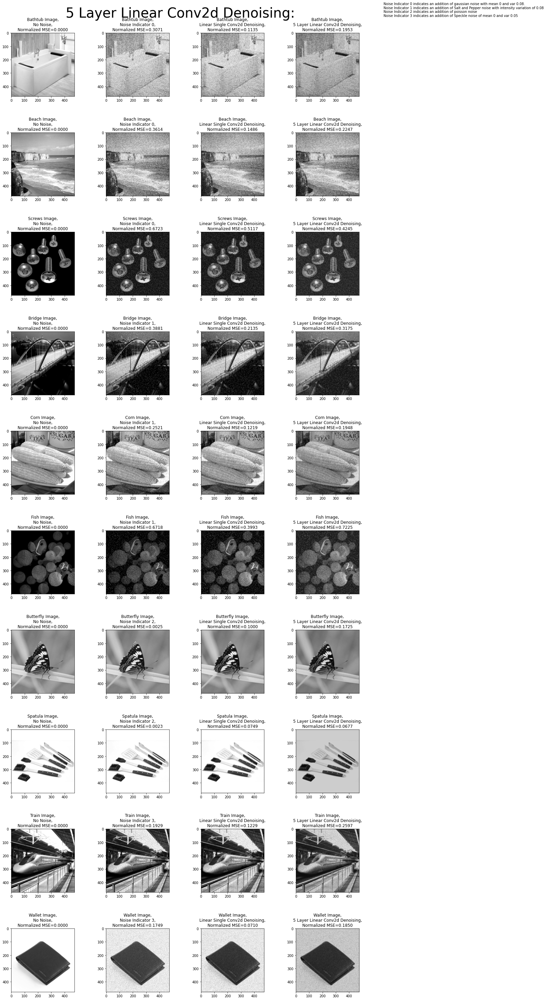

In [ ]:
## ************* Start of your Code *********************** ##

model2_img_dict_list = get_nn_denoise_img_dict_list(model2, model_img_dict_list, '5 Layer Linear Conv2d Denoising')
info_text = 'Noise Indicator 0 indicates an addition of gaussian noise with mean 0 and var 0.08.\nNoise Indicator 1 indicates an addition of Salt and Pepper noise with intensity variation of 0.08\nNoise Indicator 2 indicates an addition of poisson noise\nNoise Indicator 3 indicates an addition of Speckle noise of mean 0 and var 0.05'
plot_images(model2_img_dict_list, idx_to_img_dict, '5 Layer Linear Conv2d Denoising: ', info_text, fig_width=15, fig_height=40)

## ************ End of your code ********************   ##

# Model 3

- Add Non Linear activations((preferably ReLU) Between conv2d layers from Model 2

In [ ]:
## ************* Start of your Code *********************** ##

input_channels = 1
channel_1 = 16 
channel_2 = 8 
channel_3 = 8
channel_4 = 8
channel_5 = 1 

model3 = nn.Sequential(
    nn.Conv2d(input_channels, channel_1, kernel_size=5, padding=2),
    nn.ReLU(),
    # nn.BatchNorm2d(channel_1),
    nn.Conv2d(channel_1, channel_2, kernel_size=3, padding=1),
    nn.ReLU(),
    # nn.BatchNorm2d(channel_2),
    nn.Conv2d(channel_2, channel_3, kernel_size=3, padding=1),
    nn.ReLU(),
    # nn.BatchNorm2d(channel_3),
    nn.Conv2d(channel_3, channel_4, kernel_size=3, padding=1),
    nn.ReLU(),
    # nn.BatchNorm2d(channel_4),
    nn.Conv2d(channel_4, channel_5, kernel_size=5, padding=2),
)

## ************* End of your Code *********************** ##

In [ ]:
## Set your hypter parameters
learningRate = 1e-2  # Set this value between 1e-2 to 1e-4
weightDecay  = 1e-3   # Set this value between 1e-2 to 1e-4

epochs = 15  # Start with 50 or 100 Can experiment with maximum 200 or 400 iterations

## Optimizer
## Please Declare An Optimizer for your model. We suggest you use SGD
## ************* Start of your Code *********************** ##
optimizer = optim.Adam(model3.parameters(), weight_decay=weightDecay, lr=learningRate)
## ************ End of your code ********************   ##

In [ ]:
model3_valMSE, model3_loss_array = trainingLoop(dataloader_train,model3,optimizer,epochs)

Epoch 0
Training loss:  tensor(52036.0781, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 1
Training loss:  tensor(43309.4102, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 2
Training loss:  tensor(1544.2174, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 3
Training loss:  tensor(992.1356, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 4
Training loss:  tensor(867.8109, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 5
Training loss:  tensor(727.7244, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 6
Training loss:  tensor(670.1827, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 7
Training loss:  tensor(633.5438, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 8
Training loss:  tensor(622.2051, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 9
Training loss:  tensor(474.3480, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 10
Training loss:  tensor(364.5348, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 11
Training loss:  tensor(303.7626, device='cuda:0', 

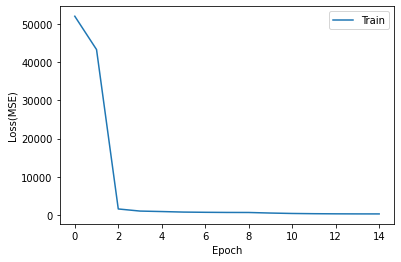

In [ ]:
plot_loss_epoch(model3_loss_array)
save_model(model3, 'model3.pt')

In [ ]:
## Test Your Model
model3.eval()
testMSE = checkTestingAccuracy(dataloader_test,model3)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  251.68500915527343


In [ ]:
# ***
# RUN THIS CELL TO LOAD SAVED MODEL FROM TRAINING ABOVE
# ***
model3.cuda()
load_model(model3, 'model3.pt')
model3.eval()
testMSE = checkTestingAccuracy(dataloader_test,model3)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  251.68500915527343


## Plot some of the Testing Dataset images by passing them through the trained model

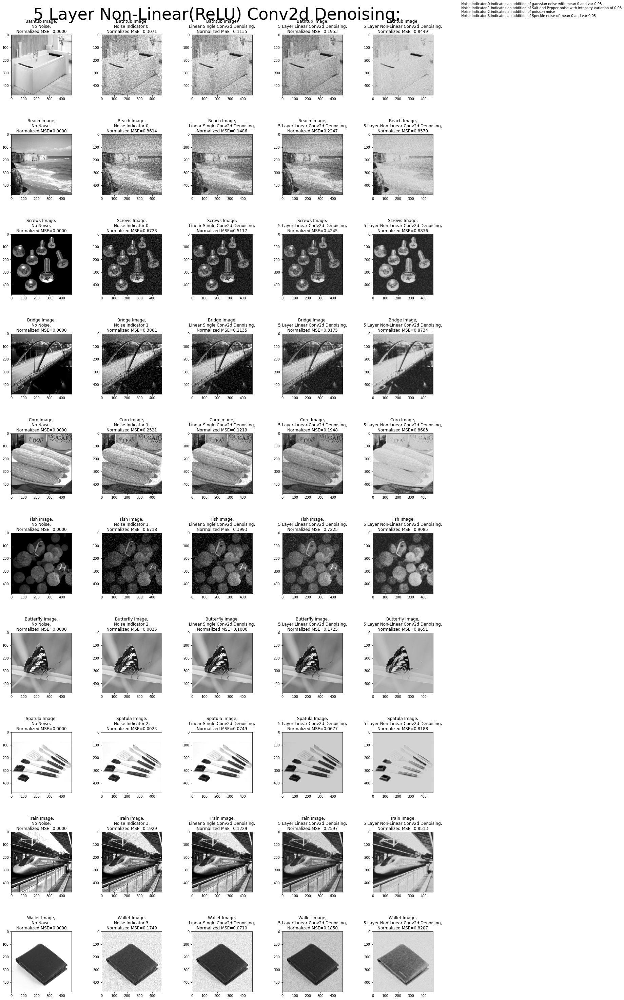

In [ ]:
## ************* Start of your Code *********************** ##

model3_img_dict_list = get_nn_denoise_img_dict_list(model3, model2_img_dict_list, '5 Layer Non-Linear Conv2d Denoising')
info_text = 'Noise Indicator 0 indicates an addition of gaussian noise with mean 0 and var 0.08.\nNoise Indicator 1 indicates an addition of Salt and Pepper noise with intensity variation of 0.08\nNoise Indicator 2 indicates an addition of poisson noise\nNoise Indicator 3 indicates an addition of Speckle noise of mean 0 and var 0.05'
plot_images(model3_img_dict_list, idx_to_img_dict, '5 Layer Non-Linear(ReLU) Conv2d Denoising: ', info_text, fig_width=18, fig_height=40)

## ************ End of your code ********************   ##

# Model 4
Going with the idea here: https://www.cs.toronto.edu/~lczhang/360/lec/w05/autoencoder.html I attempted to build a very basic autoencoder which would allow me to reduce the spatial extent of the image and then size it back up.


In [ ]:
## ************* Start of your Code *********************** ##

input_channels = 1
channel_1 = 16 
channel_2 = 8 
channel_3 = 16
channel_4 = 1 

model4 = nn.Sequential(
    nn.Conv2d(input_channels, channel_1, kernel_size=5),
    nn.ReLU(),
    nn.Conv2d(channel_1, channel_2, kernel_size=3),
    nn.ReLU(),
    nn.ConvTranspose2d(channel_2, channel_3, kernel_size=3),
    nn.ReLU(),
    nn.ConvTranspose2d(channel_3, channel_4, kernel_size=5),
)

## ************* End of your Code *********************** ##

In [ ]:
## Set your hypter parameters
learningRate = 1e-2  # Set this value between 1e-2 to 1e-4
weightDecay  = 1e-3   # Set this value between 1e-2 to 1e-4

epochs = 50  # Start with 50 or 100 Can experiment with maximum 200 or 400 iterations

## Optimizer
## Please Declare An Optimizer for your model. We suggest you use SGD
## ************* Start of your Code *********************** ##
optimizer = optim.Adam(model4.parameters(), weight_decay=weightDecay, lr=learningRate)
## ************ End of your code ********************   ##

In [ ]:
model4_valMSE, model4_loss_array = trainingLoop(dataloader_train,model4,optimizer,epochs)

Epoch 0
Training loss:  tensor(2076.3145, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 1
Training loss:  tensor(1651.1987, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 2
Training loss:  tensor(1596.5112, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 3
Training loss:  tensor(1482.3674, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 4
Training loss:  tensor(1462.1361, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 5
Training loss:  tensor(1326.6025, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 6
Training loss:  tensor(1189.0850, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 7
Training loss:  tensor(1252.1398, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 8
Training loss:  tensor(1159.2537, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 9
Training loss:  tensor(1094.1079, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 10
Training loss:  tensor(943.2787, device='cuda:0', grad_fn=<MseLossBackward>)
Epoch 11
Training loss:  tensor(869.0704, device='cuda

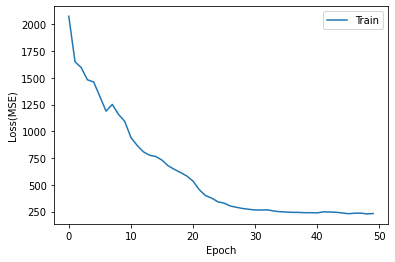

In [ ]:
plot_loss_epoch(model4_loss_array)
save_model(model4, 'model4.pt')

In [ ]:
## Test Your Model
model4.eval()
testMSE = checkTestingAccuracy(dataloader_test,model4)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  229.44332481384276


In [ ]:
# ***
# RUN THIS CELL TO LOAD SAVED MODEL FROM TRAINING ABOVE
# ***
model4.cuda()
load_model(model4, 'model4.pt')
model4.eval()
testMSE = checkTestingAccuracy(dataloader_test,model4)
print("Mean Square Error for the testing Set for the trained model is ", testMSE)

Mean Square Error for the testing Set for the trained model is  229.44332481384276


## Plot some of the Testing Dataset images by passing them through the trained model

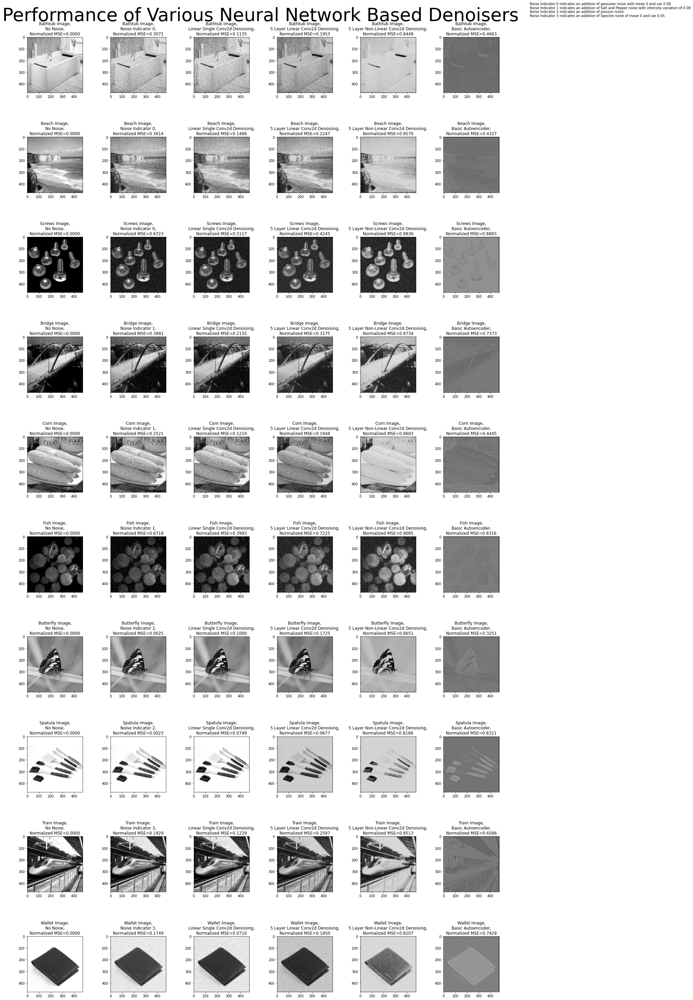

In [ ]:
## ************* Start of your Code *********************** ##

model4_img_dict_list = get_nn_denoise_img_dict_list(model4, model3_img_dict_list, 'Basic Autoencoder')
info_text = 'Noise Indicator 0 indicates an addition of gaussian noise with mean 0 and var 0.08.\nNoise Indicator 1 indicates an addition of Salt and Pepper noise with intensity variation of 0.08\nNoise Indicator 2 indicates an addition of poisson noise\nNoise Indicator 3 indicates an addition of Speckle noise of mean 0 and var 0.05'
plot_images(model4_img_dict_list, idx_to_img_dict, 'Performance of Various Neural Network Based Denoisers', info_text, fig_width=20, fig_height=40)

## ************ End of your code ********************   ##

# Analysis

Now that you have all the denoised outputs from different models, Answer the following questions.

***a. Which Model performed best and why ??***

For this part of Project 2 I investigated how a neural network based denoiser trained on a cartoon-like dataset would perform on *completely different images*.
For *this* experiment the single layer linear convolution model (model 1) performed the best. 

There are few reasons for this, the first and foremost being that I was able to somewhat effectively train this model.
There were less ways to go wrong training this model because it is not as effective at identify complex parts of the image so it was less likely to overfit to the cartoon training data.
Although there are techniques to overcome this overfitting with more complex models I could not get them to work well for the other models.

Another reason model 1 performed the best was that it worked a lot like a standard box filter whose kernel is learned from data. This means that it already follows the idea of a convolution/correlation filter.

In the end, training was difficult because I was attempting to generalize the neural networks ability to deal with completely different looking images. 
This means ideally I would have trained the neural network on a variety of images with noise so it can more easily learn how to denoise rather than picking up on various features similar in the cartoon-images.
Theoretically I should be able to get better performance using deeper and more complicated networks but that relies on having representative data and training effectively (like using a validation set).
I did notice interesting things with the more complicated non-linear networks where sometimes I would get an output that looked like an edge detector or would identify important parts of the image (see model 4)


***b. Overall Analysis***

After looking at all the outputs of a single layer linear convolution model (model 1), a 5 layer linear convolution model (model 2), a 5 layer non-linear convolution model (model 3), and a basic autoencoder model (model 4) I was note some takeaways for each:
- Model 1: 
This model performed best in terms of MSE and visual appeareance in reducing noise. I discussed why that is earlier in this notebook in-depth.
- Model 2: 
This model is effectively a deeper model 1 and I was not able to get better performance than model 1 for any images except for the cartoon-like screws image.
This is an interesting observation because this image was the closest to the training images which implies that this network was able to learn something about those training images and also the noise.
This also causes issues when generalizing, but it would suggest a wide variety of images should form the training data of a general purpose denoiser.
- Model 3: 
For this model I was not able to get better performance than either model 1 or model 2. 
This model did show some interesting things, like for the fish image I was able to better see detail in the image (like raising the intensity of the image) but in terms of MSE and noise it did appear worse than even the noisy image. 
Similar to model 2 I think that the worse performance comes down to the model easily understanding details of the training data, which was undesirable in the case of this experiment outside of understanding the noise component of the images.
This is evidenced once again by model 3 doing best on the cartoon-like screws image relative to its performance on the other images.
- Model 4:
This was my experimental model which I experimented with implemented a basic autoencoder, this enabled me to vary reduce the spatial extent of the image but then raise it again back to the output size. 
My hope with this was to get better denoising performance but I was not able to.
Once again I believe this comes down to both training and having representative data but it shows the limitations of neural networks being closely tied to data.
Some intersting observations for this was how it effectively was able to find edges in the image. 
The train image illustrates this well, even with all the variety of edges in the image this filter manages to isolate the edges of them, hinting at an even more powerful usage of a network like this.

In the end, I think this experiment showed how neural networks can be extrememly powerful for tasks like denoising and beyond, the more complicated networks seem to barely scratch the surface of potential uses in image processing.
This experiment also showed the limitations of (these) neural networks in terms of training data and their ability to generalize from the training data.